### Duel output UNet on pennate diatoms - cell count performance
### Rayna Hamilton
### May 8, 2025

We will have trained a UNet neural network to detect the locations of pennate diatom cells in strained microscopy images in 1_train_unet.ipynb and separated out likely unique cells in 3_split_blobs.ipynb.  Let's assess how well the cell counting function performs.

In [13]:
import pandas as pd
import numpy as np
import os

import matplotlib.pyplot as plt
# %matplotlib inline

from skimage.io import imread, imshow
import os
import math
from math import sqrt
import cv2
from sklearn.metrics import r2_score
import seaborn as sns

In [14]:
train_images,test_images=os.listdir("../../data/train_images/"),os.listdir("../../data/test_images/")
train_masks,test_masks=[],[]
train_unique_masks,test_unique_masks=[],[]
for file in os.listdir("../../predictions/unique_cell_masks/"):
    if file in train_images:
        train_unique_masks.append(file)
    elif file in test_images:
        test_unique_masks.append(file)
    else:
        print(file)

In [15]:
len(train_unique_masks),len(test_unique_masks)

(48, 49)

For interest, let's display all the training and testing images vs their predictions inline.

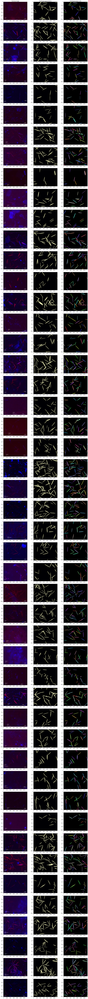

In [18]:
fig, ax = plt.subplots(48,3, figsize=(15, 160))
for i,image in enumerate(train_unique_masks):
    ax[i,0].imshow(imread(f"../../data/train_images/{image}"), cmap='magma')
    ax[i,1].imshow(imread(f"../../predictions/masks/{image}"), cmap='magma')
    ax[i,2].imshow(imread(f"../../predictions/unique_cell_masks/{image}"), cmap='magma')
ax[0,0].set_title("Training image")
ax[0,1].set_title("Predicted segmentation")
ax[0,2].set_title("Predicted unique cells")
fig.tight_layout()

In [5]:
fig.savefig("../../predictions/all_train_predictions.png")

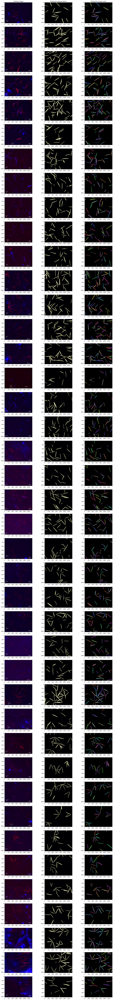

In [6]:
fig, ax = plt.subplots(41,3, figsize=(15, 120))
for i,image in enumerate(test_unique_masks):
    ax[i,0].imshow(imread(f"../../data/test_images/{image}"), cmap='magma')
    ax[i,1].imshow(imread(f"../../predictions/masks/{image}"), cmap='magma')
    ax[i,2].imshow(imread(f"../../predictions/unique_cell_masks/{image}"), cmap='magma')
ax[0,0].set_title("Testing image")
ax[0,1].set_title("Predicted segmentation")
ax[0,2].set_title("Predicted unique cells")
fig.tight_layout()

In [19]:
fig.savefig("../../predictions/all_test_predictions.png")

The segmentation often looks a bit cleaner in the training set than in the testing set, but the overall accuracy of what is identified as a unique cell appears similar in both.  While there are some cells that are missed in the many-cell clumps, the cells which are identified seem generally quite accurate and do not seem biased towards red or blue cells, so I will call this performance acceptable.  The segmentation accuracies and F1 scores are detailed in 2_assess_unet.ipynb.  Now that we have unique cells identified, let's calculate cell count accuracy.

In [20]:
cell_counts=pd.read_csv("../../cell_counts.csv")
cell_counts.head()

,filename,dataset,cell_count
0,AS_A_I_15_2-20240718,train,23
1,AS_A_I_15_2-20240724,train,34
2,AS_A_I_15_4-20240720,train,28
3,AS_A_I_22_4-20240718,train,15
4,AS_A_I_22_4-20240722,train,8


In [21]:
cell_counts[["full_filename"]]=cell_counts[["filename"]]

In [22]:
for row in cell_counts.index:
    for train_image in train_unique_masks:
        if train_image.startswith(cell_counts.at[row,"filename"].replace(".jpg","")):
            cell_counts.at[row,"full_filename"]=train_image
    for test_image in test_unique_masks:
        if test_image.startswith(cell_counts.at[row,"filename"].replace(".jpg","")):
            cell_counts.at[row,"full_filename"]=test_image

In [23]:
cell_counts["predicted_cell_count"]=-1

In [24]:
for row in cell_counts.index:
    predicted_cell_coordinates=open("../../predictions/tsvs/"+cell_counts.at[row,'full_filename'].replace('.jpg','.tsv')).readlines()
    cell_count=int(predicted_cell_coordinates[-1].split("\t")[0])+1#the last line of the file is the number and coordinates of the last cell, but it is 0-indexed so we add one to get cell count
    cell_counts.at[row,"predicted_cell_count"]=cell_count

In [26]:
r2_score(list(cell_counts.loc[cell_counts.dataset=="train","cell_count"]),list(cell_counts.loc[cell_counts.dataset=="train","predicted_cell_count"]))

0.9111196081039146

In [27]:
cell_counts

,filename,dataset,cell_count,full_filename,predicted_cell_count
0,AS_A_I_15_2-20240718,train,23,AS_A_I_15_2-20240718.jpg,23
1,AS_A_I_15_2-20240724,train,34,AS_A_I_15_2-20240724.jpg,34
2,AS_A_I_15_4-20240720,train,28,AS_A_I_15_4-20240720-C28.jpg,29
3,AS_A_I_22_4-20240718,train,15,AS_A_I_22_4-20240718-C15.jpg,16
4,AS_A_I_22_4-20240722,train,8,AS_A_I_22_4-20240722.jpg,9
5,AS_A_I_22_5-20240718,train,13,AS_A_I_22_5-20240718-C13.jpg,13
6,AS_A_U_15_1-20240726,test,16,AS_A_U_15_1-20240726-C.jpg,14
7,AS_A_U_15_3-20240722,train,33,AS_A_U_15_3-20240722.jpg,29
8,AS_A_U_15_4-20240726,test,28,AS_A_U_15_4-20240726-C.jpg,28
9,AS_A_U_22_1-20240726,train,8,AS_A_U_22_1-20240726.jpg,8


In [28]:
r2_score(list(cell_counts.loc[cell_counts.dataset=="test","cell_count"]),list(cell_counts.loc[cell_counts.dataset=="test","predicted_cell_count"]))

0.8836005344021376

In [29]:
cell_counts[["r^2"]]=r2_score(list(cell_counts.loc[cell_counts.dataset=="test","cell_count"]),list(cell_counts.loc[cell_counts.dataset=="test","predicted_cell_count"]))
cell_counts.loc[cell_counts.dataset=="train", "r^2"]=r2_score(list(cell_counts.loc[cell_counts.dataset=="train","cell_count"]),list(cell_counts.loc[cell_counts.dataset=="train","predicted_cell_count"]))

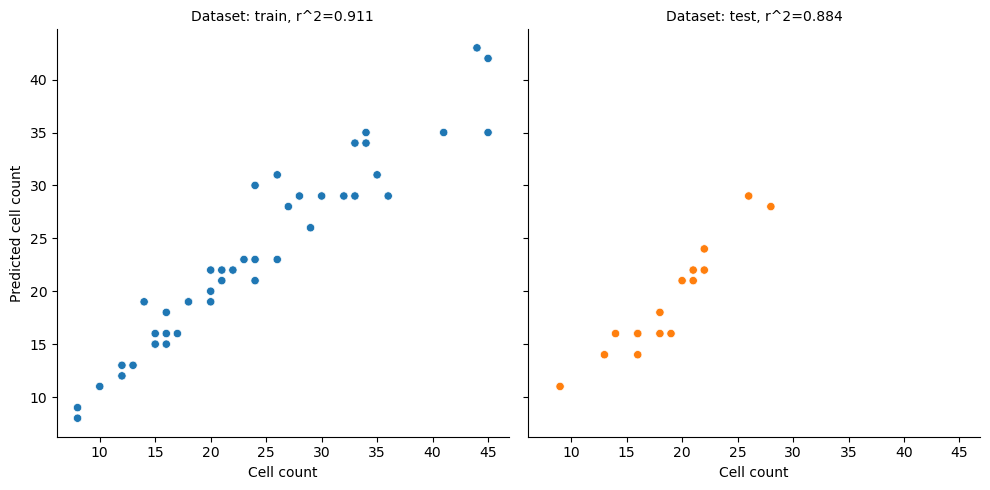

In [30]:
cell_counts[["display"]]=""
for row in cell_counts.index:
    cell_counts.at[row,"display"]=cell_counts.at[row,"dataset"]+", r^2="+str(round(cell_counts.at[row,"r^2"],3))
sns.relplot(data=cell_counts,x="cell_count",y="predicted_cell_count",col="display",hue="dataset",legend=False).set_titles("Dataset: {col_name}").set_axis_labels("Cell count", "Predicted cell count")

We have r^2 values around 0.9 for both the training and testing set, which seems acceptable.